<a href="https://colab.research.google.com/github/nivba/AdversariallDoublePatch/blob/master/DoubleAdverserialMultiPatch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Double Multi Patch

## Notebook Overview
In this notebock we present our work on double multi patch. This notebook has three sections:


*   Overview - contains details about the task and the notebook.
*   Code Setup- consists of environment preparation, data overview, patch related functions and experament, and the optimization of three deperate patches. 
*    Experiments & Results: includes patch performance evaluation, patch transferability evaluation, and patch scale dependency evaluation.


### Multi Patch
Adversarial patches are a growing concern in the field of machine learning and computer vision. These patches are small, contain a carefully crafted pattern of colors or shapes, and often physically printable images that can be placed on top of an object to fool image recognition models into misclassifying the object [1]. Adversarial patches can be used to attack a wide range of image recognition models, including those used in security systems, self-driving cars, and other applications

### Our Goal
our goal is to optimize an adverserial multi patch that able to drive second seperate labels out of the victim model when rotated in 90 degrees.

As such, we are extending the definition of adverserial multi patch that seted by Brown et al over here: https://arxiv.org/abs/1712.09665.

### problem formulation

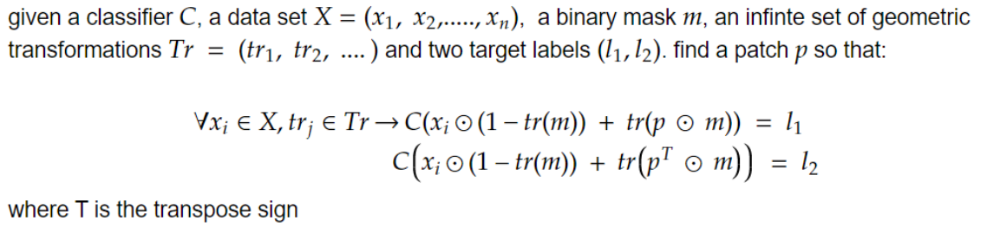

## Code Setup

### enviorment preperation

#### Module loading

In [ ]:
#### Load Modules ####

import os
import json
import math
import time
import numpy as np 
import scipy.linalg
from google.colab import drive
## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms
# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Path to the folder where the datasets are/should be downloaded (e.g. MNIST)
DATASET_PATH = "../data"

# Setting the seed
#pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
#torch.backends.cudnn.determinstic = True
#torch.backends.cudnn.benchmark = False

# Fetching the device that will be used throughout this notebook
DEVICE = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print("Using device", DEVICE)

Using device cuda:0


### Assets Loading
*    for data set we are using TinyImageNet- a derivetiv of ImageNet consists of 5000 Images of 1000 different labels.
*    Additionally, we are loading trained and ready-to-use patches; in the training section, you can choose to use them or retrain your own patches.

In [ ]:
### Load Assets ###

### Load dataset ###
import urllib.request
from urllib.error import HTTPError
import zipfile
# Github URL for the dataset
file_url = "https://github.com/nivba/AdversariallDoublePatch/blob/master/Data/TinyImageNet.zip?raw=true"
# Files to download
file_name = "TinyImageNet.zip"
# Create checkpoint path if it doesn't exist yet
os.makedirs(DATASET_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
file_path = os.path.join(DATASET_PATH, file_name)
if not os.path.isfile(file_path):
    print(f"Downloading {file_url}...")
    try:
        urllib.request.urlretrieve(file_url, file_path)
    except HTTPError as e:
        print("Something went wrong- error downloading", e)
    if file_name.endswith(".zip"):
        print("Unzipping file...")
        with zipfile.ZipFile(file_path, 'r') as zip_ref:
            zip_ref.extractall(file_path.rsplit("/",1)[0])

#### Load ready to use adverserial patches ####
## GoldfishBlackSwanPatch
goldfish_black_swan_patch_name = "GoldfishBlackSwanPatch.npy"
goldfish_black_swan_patch_path = os.path.join(DATASET_PATH, goldfish_black_swan_patch_name)
goldfish_black_swan_patch_url = "https://github.com/nivba/AdversariallDoublePatch/blob/master/Patches/GoldfishBlackSwanPatch.npy?raw=true"
if not os.path.isfile(goldfish_black_swan_patch_path):
  urllib.request.urlretrieve(goldfish_black_swan_patch_url, goldfish_black_swan_patch_path)

## FluteRiflePatch
flute_rifle_patch_name = "FluteRiflePatch.npy"
flute_rifle_patch_path = os.path.join(DATASET_PATH, flute_rifle_patch_name)
flute_rifle_patch_url = "https://github.com/nivba/AdversariallDoublePatch/blob/master/Patches/FluteRiflePatch.npy?raw=true"
if not os.path.isfile(flute_rifle_patch_path):
  urllib.request.urlretrieve(flute_rifle_patch_url, flute_rifle_patch_path)

## AntZebraPatch
ant_zebra_patch_name = "AntZebraPatch.npy"
ant_zebra_patch_path = os.path.join(DATASET_PATH, ant_zebra_patch_name)
ant_zebra_patch_url = "https://github.com/nivba/AdversariallDoublePatch/blob/master/Patches/AntZebraPatch.npy?raw=true"
if not os.path.isfile(ant_zebra_patch_path):
  urllib.request.urlretrieve(ant_zebra_patch_url, ant_zebra_patch_path)


Unzipping file...


In [ ]:
# Mean and Std from ImageNet
PATCH_SIZE = 128
IMAGE_SIZE = 224
NORM_MEAN = np.array([0.485, 0.456, 0.406])
NORM_STD = np.array([0.229, 0.224, 0.225])
# No resizing and center crop necessary as images are already preprocessed.
NORMALIZER = transforms.Normalize(mean=NORM_MEAN,
                         std=NORM_STD)
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN,
                         std=NORM_STD)
])

# Load dataset and create data loader
imagenet_path = os.path.join(DATASET_PATH, "TinyImageNet/")
assert os.path.isdir(imagenet_path), f"Could not find the ImageNet dataset at expected path \"{imagenet_path}\". " 
dataset = torchvision.datasets.ImageFolder(root=imagenet_path, transform=plain_transforms)
data_loader = data.DataLoader(dataset, batch_size=64, shuffle=True, drop_last=False, num_workers=8)

# Load label names to interpret the label numbers 0 to 999
with open(os.path.join(imagenet_path, "label_list.json"), "r") as f:
    label_names = json.load(f)
    
def get_label_index(lab_str):
    assert lab_str in label_names, f"Label \"{lab_str}\" not found. Check the spelling of the class."
    return label_names.index(lab_str)

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


#### Loading victim models
In this study, we are using 3 victim models, each of which has been trained using the entire ImageNet dataset and will be used to optimize and test our adverserial patches. 

In [ ]:
#### load and setup victim models  ####

# No gradients needed for the network
def freeze_model(model):
  model.eval()
  for p in model.parameters():
      p.requires_grad = False

# Load CNN architecture pretrained on ImageNet
victim_models = {'resnet34': torchvision.models.resnet34(pretrained=True),
                'vgg16': torchvision.models.vgg16(pretrained=True),
                 'densenet121':torchvision.models.densenet121(pretrained=True)}
victim_models = {name: model for name, model in victim_models.items()}
for model in victim_models.values():
  freeze_model(model)
  model.to(DEVICE)


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


  0%|          | 0.00/30.8M [00:00<?, ?B/s]

#### helper visualistion functions


In [ ]:
#### Some helper functions to compute and view results ####

def show_prediction(img, label, pred, K=5, adv_img=None, patch=None, target_name=None):
    
    if isinstance(img, torch.Tensor):
        # Tensor image to numpy
        img = normalize_to_show(img)
        label = label.item()

    # Plot on the left the image with the true label as title.
    # On the right, have a horizontal bar plot with the top k predictions including probabilities
    if patch is None or adv_img is None:
        fig, ax = plt.subplots(1, 2, figsize=(10,2), gridspec_kw={'width_ratios': [1, 1]})
    else:
        fig, ax = plt.subplots(1, 5, figsize=(12,2), gridspec_kw={'width_ratios': [1, 1, 1, 1, 2]})
    
    ax[0].imshow(img)
    ax[0].set_title(label_names[label])
    ax[0].axis('off')
    
    if adv_img is not None and patch is not None:
        # Visualize adversarial images
        adv_img = normalize_to_show(adv_img)
        ax[1].imshow(adv_img)
        ax[1].set_title('Adversarial')
        ax[1].axis('off')
        # Visualize patch
        target_name = "" if target_name is None else target_name
        patch = normalize_to_show(patch)
        ax[2].imshow(patch)
        ax[2].set_title('patch- ' + target_name)
        ax[2].axis('off')
        # buffer
        ax[3].axis('off')
    
    if abs(pred.sum().item() - 1.0) > 1e-4:
        pred = torch.softmax(pred, dim=-1)
    topk_vals, topk_idx = pred.topk(K, dim=-1)
    topk_vals, topk_idx = topk_vals.cpu().numpy(), topk_idx.cpu().numpy()
    ax[-1].barh(np.arange(K), topk_vals*100.0, align='center', color=["C0" if topk_idx[i]!=label else "C2" for i in range(K)])
    ax[-1].set_yticks(np.arange(K))
    ax[-1].set_yticklabels([label_names[c] for c in topk_idx])
    ax[-1].invert_yaxis()
    ax[-1].set_xlabel('Confidence')
    ax[-1].set_title('Predictions')
    
    plt.show()
    plt.close()

def normalize_to_show(img):
  img = img.clone()
  img = img.cpu().permute(1, 2, 0).numpy()
  img = (img * NORM_STD[None,None]) + NORM_MEAN[None,None]
  img = np.clip(img, a_min=0.0, a_max=1.0)
  return img

### Data set and models example


model name: resnet34


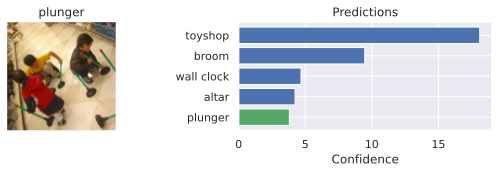

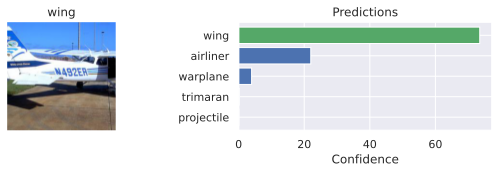

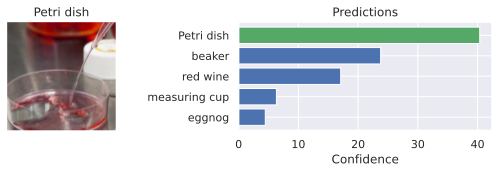

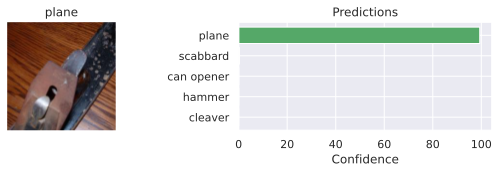

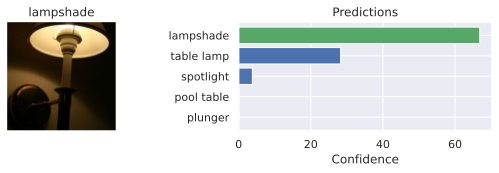

model name: vgg16


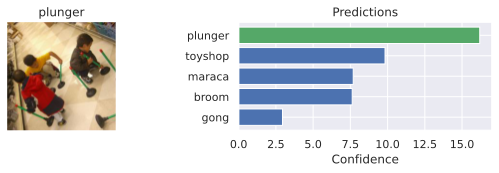

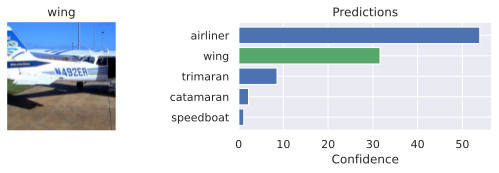

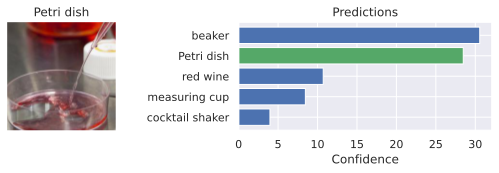

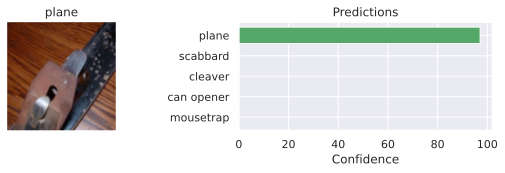

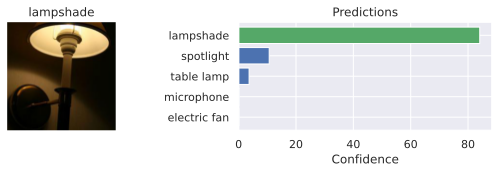

model name: densenet121


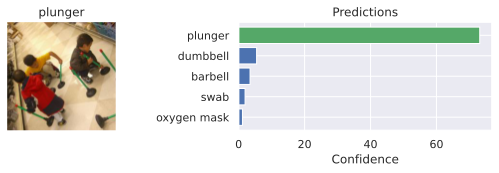

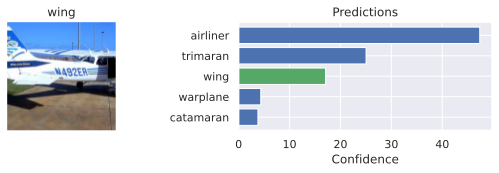

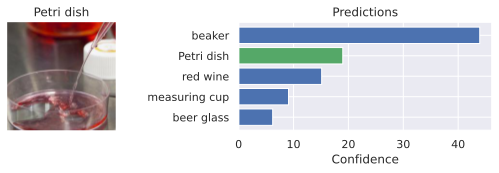

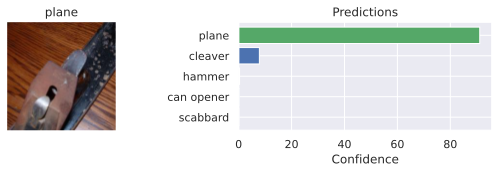

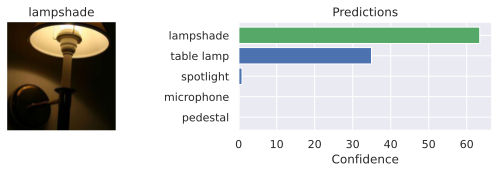

In [ ]:
exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
  for name, model in victim_models.items():
    print('model name: %s' % name)
    preds = model(exmp_batch.to(DEVICE))
    for i in range(0,5):
        show_prediction(exmp_batch[i], label_batch[i], preds[i])

### Patch and affine transformation related functions and examples

To train our patches to be resilient against translations, rotations, and scaling in space we will use affine transformations.

An affine transformation is a geometric transformation that preserves lines and parallelism, but not necessarily Euclidean distances and angles.
Affinity transformations are driven by affine matrixes that are relatively easy to calculate.

We are using 3 different victim models, each of them trained on the full ImageNet Dataset And will use us to optimize and test our adverserial patches.

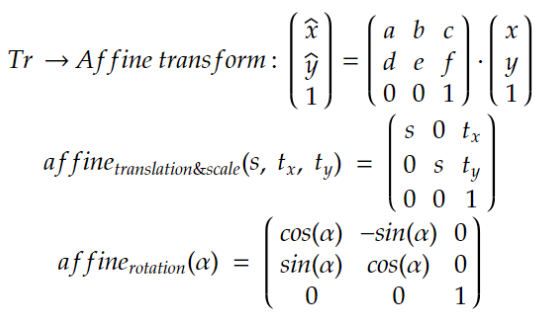

In [ ]:
def create_circular_mask(h, w):
    center = (int(w/2), int(h/2))
    radius = min(center[0], center[1], w-center[0], h-center[1])
    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)
    mask = torch.from_numpy(dist_from_center <= radius)
    return mask.float()

def get_affine_trans(angle, scale, translations):
  t1 = torch.tensor([[scale, 0, translations[0]],
                     [0, scale, translations[1]],
                     [0, 0, 1]], dtype=torch.float)
  
  t2 = torch.tensor([[np.cos(angle), -np.sin(angle), 0],
                     [np.sin(angle), np.cos(angle), 0],
                     [0, 0, 1]], dtype=torch.float)
  t = torch.matmul(t2, t1)
  return t.requires_grad_(False)

def apply_affine(affine_matrixs, imgs, image_size):
  affine_matrixs_slices = affine_matrixs[:, :2, :]
  grid = F.affine_grid(affine_matrixs_slices, image_size)
  return  F.grid_sample(imgs, grid)

def deg2rad(angle):
  return np.pi * (angle / 180)

def scale2affine(scale, image_size, patch_size):
  return  image_size / (scale * patch_size)

def trans2affine(translation, patch_size):
  return (2 * translation[0] / patch_size, 2 * translation[1] / patch_size)


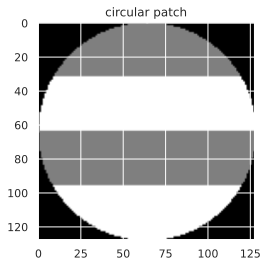

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


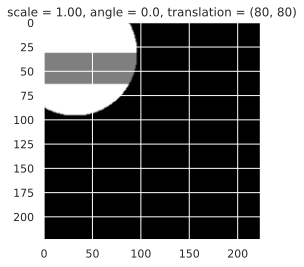

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


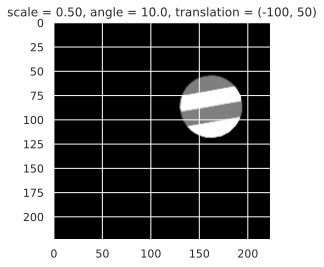

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


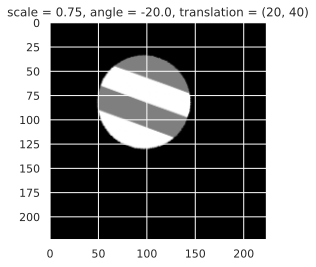

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


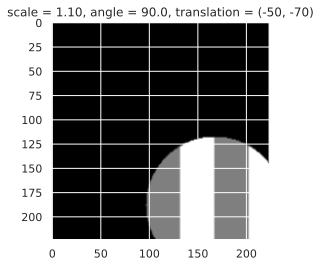

In [ ]:
### patch transformation expirament ###

patch = torch.zeros((3, PATCH_SIZE, PATCH_SIZE), dtype=torch.float)
patch[:, : PATCH_SIZE // 4,:] = 0.5
patch[:, PATCH_SIZE // 4 :  2 * PATCH_SIZE // 4,:] = 1
patch[:, 2 *PATCH_SIZE // 4 :  3 * PATCH_SIZE // 4,:] = 0.5
patch[:, 3 * PATCH_SIZE // 4 :, :] = 1
mask = create_circular_mask(PATCH_SIZE, PATCH_SIZE)
patch *= mask
plt.imshow(patch.cpu().permute(1, 2, 0).numpy())
plt.title("circular patch")
plt.show()

angles_vec = [0, 10, -20, 90]

scales_vec = [1, 0.5 , 0.75, 1.1]

translations_vec = [(80, 80), (-100, 50), (20,40) ,(-50,-70)]

target_torch_size = torch.Size((1, 3, IMAGE_SIZE, IMAGE_SIZE))
patch_unsqueeze = torch.unsqueeze(patch, dim=0)

for i in range(len(angles_vec)):
  angle = deg2rad(angles_vec[i])
  scale = scale2affine(scales_vec[i], IMAGE_SIZE, PATCH_SIZE)
  translation = trans2affine(translations_vec[i], PATCH_SIZE)
  affine_matrix = get_affine_trans(angle, scale, translation)
  affine_matrix = torch.unsqueeze(affine_matrix, dim=0)
  trans_patch = apply_affine(affine_matrix, patch_unsqueeze, target_torch_size)
  trans_patch_img = trans_patch.squeeze().permute(1, 2, 0).numpy()
  plt.imshow(trans_patch_img)
  plt.title("scale = %1.2f, angle = %1.1f, translation = (%d, %d)" %
            (scales_vec[i], angles_vec[i], translations_vec[i][0], translations_vec[i][1]))
  plt.show()


In [ ]:
### another affine matrixes related functions we are using in the future
def get_rand_affine(patch_size, image_size, scale_range, max_angle):
  scale = np.random.uniform(scale_range[0], scale_range[1])
  margin = (scale * patch_size) / 2 
  max_translation = image_size / 2 - margin
  translation = (np.random.uniform(-max_translation, max_translation),
                 np.random.uniform(-max_translation, max_translation))
  angle = np.random.uniform(-max_angle, max_angle)
  angle = deg2rad(angle)
  scale = scale2affine(scale, image_size, patch_size)
  translation = trans2affine(translation, patch_size)
  return get_affine_trans(angle, scale, translation)

def get_rot90_affine():
  return get_affine_trans(deg2rad(90), 1, (0, 0))

def get_identity_affine():
  return get_affine_trans(0, 1, (0, 0))

def get_adv_labels(is_rotate, target_label1, target_label2):
  is_rotate_tensor = torch.from_numpy(is_rotate)
  labels = target_label1 * (1 - is_rotate_tensor) + target_label2 * is_rotate_tensor
  return labels.type(torch.int64).to(DEVICE)


def get_affine_matrixes(patch_size, image_size, scale_range, max_angle, is_rotate):
  affine_matrix_list = []
  rot90_affine = get_rot90_affine()
  for i in range(len(is_rotate)):
    random_affine = get_rand_affine(patch_size, image_size, scale_range, max_angle)
    if is_rotate[i]:
      affine_matrix_list.append(torch.matmul(rot90_affine, random_affine))
    else:
      affine_matrix_list.append(random_affine)
  affine_matrixes = torch.stack(affine_matrix_list, dim=0).to(DEVICE)
  return affine_matrixes


###Training
The first step in this section is to define functions necessary for the patch optimization problem. Then we trained 3 different patches. The retrain option is off by default. If you want to re-train the patches yourself, navigate to the relevant training section in the code and change the relevant retrain variable from 0 to 1 (for example: retrain_goldfish_black_swan = 1).
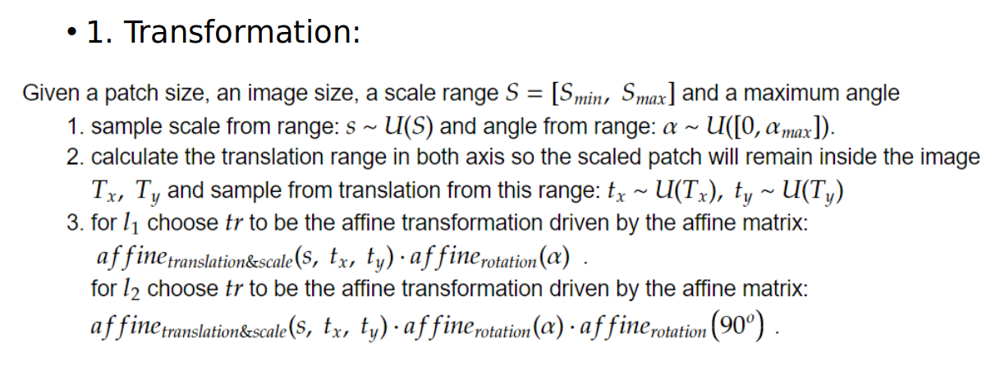

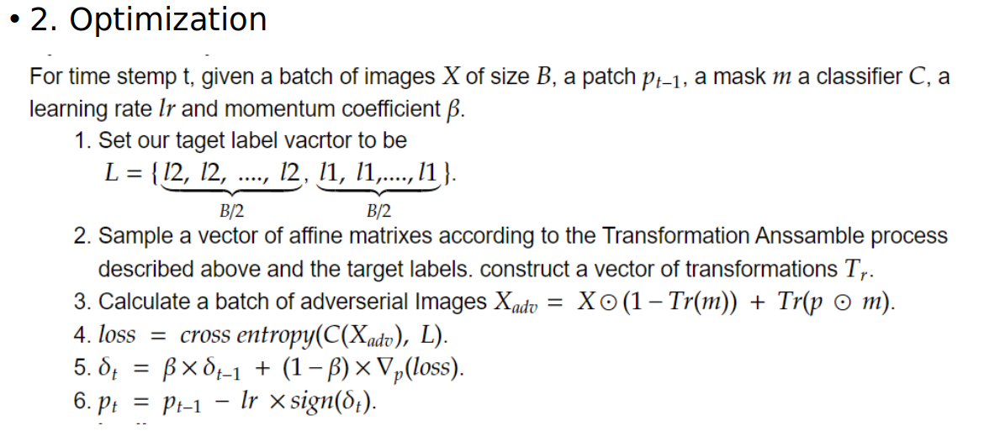

#### training utility functuons

In [ ]:
def init_patch(patch_size):
  return torch.rand((3, patch_size, patch_size), dtype=torch.float, requires_grad=True)

def get_patch_loss(victim_model,
         images,
         patch,
         mask,
         target_label1,
         target_label2,
         is_rotate,
         patch_size,
         image_size,
         scale_range,
         max_angle):
  inp_images = images.clone().to(DEVICE)
  labels = get_adv_labels(is_rotate, target_label1, target_label2).to(DEVICE)
  affine_matrixes = get_affine_matrixes(patch_size, image_size, scale_range, max_angle, is_rotate).to(DEVICE)
  target_torch_size_patch = torch.Size((len(is_rotate), 3, image_size, image_size))
  target_torch_size_mask = torch.Size((len(is_rotate), 1, image_size, image_size))
  patch_norm = NORMALIZER(patch)
  patch_unsqueeze = patch_norm.repeat(len(is_rotate),1, 1, 1).to(DEVICE)
  mask_unsqueeze = torch.unsqueeze(mask, dim=0).repeat(len(is_rotate),3, 1, 1).to(DEVICE)

  trans_patches = apply_affine(affine_matrixes, patch_unsqueeze, target_torch_size_patch).to(DEVICE)
  trans_masks = apply_affine(affine_matrixes, mask_unsqueeze, target_torch_size_patch).squeeze_().to(DEVICE)

  adv_imgs = (1 - trans_masks) * inp_images + trans_masks * trans_patches
  adv_imgs.requires_grad_()
  preds = victim_model(adv_imgs)
  preds = F.log_softmax(preds, dim=-1)
  loss = -torch.gather(preds, 1, labels.unsqueeze(dim=-1))
  return loss.sum() / len(is_rotate)


def train(victim_model,
          patch,
          patch_size,
          image_size,
          scale_range,
          max_angle,
          ephocs,
          batch_size,
          lr,
          beta,
          decay_rate,
          dataset,
          target_label1,
          target_label2,
          save_to_drive=False,
          patch_name=None):
  if save_to_drive:
    drive.mount('/content/drive')
    patch_name = 'patch' if patch_name is None else patch_name
  data_loader = data.DataLoader(dataset, batch_size=batch_size, shuffle=True,
                                drop_last=False, num_workers=8,)
  victim_model.to(DEVICE)
  mask = create_circular_mask(patch_size, patch_size).requires_grad_(False).to(DEVICE)

  pbar = tqdm(total=len(data_loader), desc='batch', position=0,
          bar_format='{l_bar}{bar:10}{r_bar}{bar:-10b}')
  batch_log = tqdm(total=0, position=1, bar_format='{desc}')
  losses = []
  momentum = None
  for epoch in range(ephocs):
    epoch_loss = 0
    pbar.reset()
    for i_batch, sample_batch in enumerate(data_loader):
      img_batch, _ = sample_batch
      is_rotate = np.zeros(img_batch.shape[0])
      is_rotate[: int(img_batch.shape[0] // 2)] = 1
      img_batch = img_batch.clone().to(DEVICE)
      patch_clone = patch.clone().requires_grad_().to(DEVICE)
      patch_clone.retain_grad()
      loss = get_patch_loss(victim_model,
                            img_batch,
                            patch_clone,
                            mask,
                            target_label1,
                            target_label2,
                            is_rotate,
                            patch_size,
                            image_size,
                            scale_range,
                            max_angle)
      loss.backward()
      grad = patch_clone.grad
      if momentum is None:
        momentum = grad.cpu()
      else:
        momentum = momentum * beta + grad.cpu() * (1 - beta)
      with torch.no_grad():
        patch = (patch - lr * momentum.sign()).clamp(0,1)
      epoch_loss += loss.detach().item()
      curr_loss = epoch_loss / (i_batch + 1)
      pbar.update(1)
      batch_log.set_description_str("Epoch : %d, loss: %1.3f" % (epoch, curr_loss))
    losses.append(epoch_loss)
    if len(losses) >= 2 and losses[-2] < epoch_loss:
      break
    if save_to_drive:
      with open('/content/drive/My Drive/' + patch_name + '.npy', 'wb') as f:
        np.save(f, patch.clone().cpu().detach().permute(1, 2, 0).numpy())
    lr *= decay_rate
  plt.plot(list(range(len(losses))), losses)
  plt.title('training losses')
  plt.xlabel("epoch")
  plt.ylabel("loss")
  plt.show()
  return patch
        

####target1: goldfish, target2: black swan, victim model: resnet34

Mounted at /content/drive


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


batch:   0%|          | 0/157 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


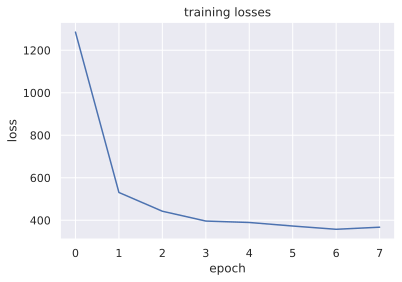

In [ ]:
## goldfish black swan train
retrain_goldfish_black_swan = 0
if(retrain_goldfish_black_swan):
  trarget1 = get_label_index('goldfish')
  trarget2 = get_label_index('black swan')
  patch = init_patch(patch_size=PATCH_SIZE)
  goldfish_black_swan_patch = train(victim_model=victim_models['resnet34'],
                patch=patch,
                patch_size=PATCH_SIZE,
                image_size=IMAGE_SIZE,
                scale_range=(0.2, 1),
                max_angle=10,
                ephocs=10,
                batch_size=32,
                lr=0.01,
                beta=0.7,
                decay_rate=0.65,
                dataset=dataset,
                target_label1=trarget1,
                target_label2=trarget2,
                save_to_drive=True,
                patch_name='GoldfishBlackSwanPatch')


Training loss of goldfish_black_swan_patch optimization process, we can see that the loss reaches plato after 3 epochs.

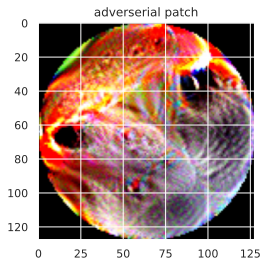

In [ ]:
if(retrain_goldfish_black_swan):
  mask = create_circular_mask(PATCH_SIZE, PATCH_SIZE)
  with torch.no_grad():
    goldfish_black_swan_patch = NORMALIZER(goldfish_black_swan_patch * mask)
  plt.imshow(normalize_to_show(goldfish_black_swan_patch))
  plt.title("adverserial patch")
  plt.show()

goldfish_black_swan_patch 

####target1: flute, target2: rifle, victim model: vgg16

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


batch:   0%|          | 0/157 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


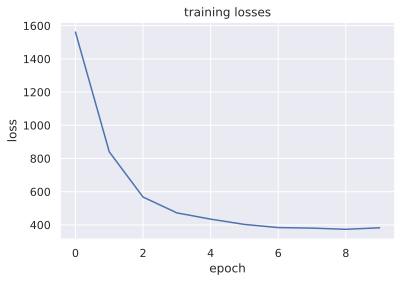

In [ ]:
retrain_flute_rifle = 0
if(retrain_flute_rifle):
  trarget1 = get_label_index('flute')
  trarget2 = get_label_index('rifle')
  drive.mount('/content/drive')
  patch = init_patch(patch_size=PATCH_SIZE)
  with open('/content/drive/My Drive/patch.npy', 'wb') as f:
    np.save(f, patch.clone().cpu().detach().permute(1, 2, 0).numpy())
  flute_rifle_patch = train(victim_model=victim_models['vgg16'],
                patch=patch,
                patch_size=PATCH_SIZE,
                image_size=IMAGE_SIZE,
                scale_range=(0.2, 1),
                max_angle=10,
                ephocs=10,
                batch_size=32,
                lr=0.01,
                beta=0.7,
                decay_rate=0.65,
                dataset=dataset,
                target_label1=trarget1,
                target_label2=trarget2,
                save_to_drive=True,
                patch_name='FluteRiflePatch')

Training loss of flute_rifle_patch optimization process, we can see that the loss reaches plato after 4 epochs.

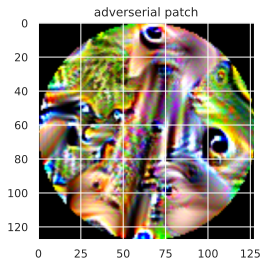

In [ ]:
if(retrain_flute_rifle):
  mask = create_circular_mask(PATCH_SIZE, PATCH_SIZE)
  with torch.no_grad():
    flute_rifle_patch = NORMALIZER(flute_rifle_patch * mask)
  plt.imshow(normalize_to_show(flute_rifle_patch))
  plt.title("adverserial patch")
  plt.show()

flute_rifle_patch

####target1: ant, target2: zebra, victim model: densenet121

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


batch:   0%|          | 0/157 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


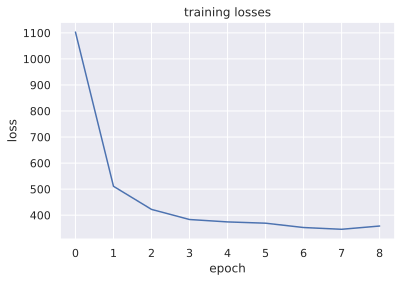

In [ ]:
retrain_ant_zebra = 0
if(retrain_ant_zebra):
  trarget1 = get_label_index('ant')
  trarget2 = get_label_index('zebra')
  drive.mount('/content/drive')
  patch = init_patch(patch_size=PATCH_SIZE)
  with open('/content/drive/My Drive/patch.npy', 'wb') as f:
    np.save(f, patch.clone().cpu().detach().permute(1, 2, 0).numpy())
  ant_zebra_patch = train(victim_model=victim_models['densenet121'],
                patch=patch,
                patch_size=PATCH_SIZE,
                image_size=IMAGE_SIZE,
                scale_range=(0.2, 1),
                max_angle=10,
                ephocs=10,
                batch_size=32,
                lr=0.01,
                beta=0.7,
                decay_rate=0.65,
                dataset=dataset,
                target_label1=trarget1,
                target_label2=trarget2,
                save_to_drive=True,
                patch_name='AntZebraPatch')

Training loss of ant_zebra_patch optimization process, we can see that the loss reaches plato after 4 epochs.

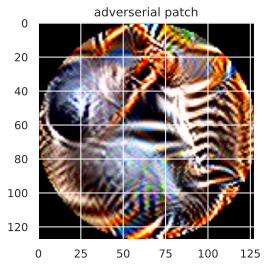

In [ ]:
if(retrain_ant_zebra):
  mask = create_circular_mask(PATCH_SIZE, PATCH_SIZE)
  with torch.no_grad():
    ant_zebra_patch = NORMALIZER(ant_zebra_patch * mask)
  plt.imshow(normalize_to_show(ant_zebra_patch))
  plt.title("adverserial patch")
  plt.show()

ant_zebra_patch

##Experiments & Results
In order to evaluate our adverserial patches ability to fool models we conducted three types of experiments.


*   Firstly, we are visualizing our model predictions on actual adverserial images created by applying our patches to samples from the data set using random affine matrixes.
*   Overall parformence evaluation- assessing the target performance of patches, the specificity of patches, and the transferability of patches between models.
* Scale performence- assisng how the patch scale effecting his seccess rate.



### data loading and utility functions

In [ ]:
### load_trained_patches ###
with torch.no_grad():
  if(not retrain_goldfish_black_swan):
    print('loading our pretrain patch for goldfish_black_swan_patch...')
    with open(goldfish_black_swan_patch_path, 'rb') as f:
      goldfish_black_swan_patch = np.load(f)
    goldfish_black_swan_patch = torch.from_numpy(goldfish_black_swan_patch).permute(2, 0, 1)
    goldfish_black_swan_patch = NORMALIZER(goldfish_black_swan_patch * mask)
  else:
    print('using retrain example for- goldfish_black_swan_patch')
  if(not retrain_flute_rifle):
    print('loading our pretrain patch for flute_rifle_patch...')
    with open(flute_rifle_patch_path, 'rb') as f:
      flute_rifle_patch = np.load(f)
    flute_rifle_patch = torch.from_numpy(flute_rifle_patch).permute(2, 0, 1)
    flute_rifle_patch = NORMALIZER(flute_rifle_patch * mask)
  else:
    print('using retrain example for- flute_rifle_patch')
  if(not retrain_ant_zebra):
    print('loading our pretrain patch for ant_zebra_patch...')
    with open(ant_zebra_patch_path, 'rb') as f:
      ant_zebra_patch = np.load(f)
    ant_zebra_patch = torch.from_numpy(ant_zebra_patch).permute(2, 0, 1)
    ant_zebra_patch = NORMALIZER(ant_zebra_patch * mask)
  else:
    print('using retrain example for- ant_zebra_patch')

  


loading our pretrain patch for goldfish_black_swan_patch...
loading our pretrain patch for flute_rifle_patch...
loading our pretrain patch for ant_zebra_patch...


In [ ]:
### utility functions ###
def get_rand_adv_img(image, 
                    patch,
                    mask,
                    scale_range,
                    max_angle,
                    rotate,
                    patch_size,
                    image_size):
  patch_inp = patch.clone().to(DEVICE)
  image_inp = image.clone().to(DEVICE)
  mask_inp = mask.clone().to(DEVICE)
  random_affine = get_rand_affine(patch_size, image_size, scale_range, max_angle)
  affine_matrix = torch.matmul(get_rot90_affine(), random_affine) if rotate else random_affine
  affine_matrix = affine_matrix.unsqueeze(dim=0).to(DEVICE)

  target_torch_size_patch = torch.Size((1, 3, image_size, image_size))

  patch_unsqueeze = patch_inp.unsqueeze(dim=0)
  mask_unsqueeze = torch.unsqueeze(mask_inp, dim=0).repeat(1 ,3, 1, 1)
  trans_patches = apply_affine(affine_matrix, patch_unsqueeze, target_torch_size_patch).to(DEVICE)
  trans_masks = apply_affine(affine_matrix, mask_unsqueeze, target_torch_size_patch).squeeze_().to(DEVICE)
  adv_img = (1 - trans_masks) * image_inp + trans_masks * trans_patches
  return adv_img

def eval_patch_on_image(image,
                        label, 
                        patch,
                        mask,
                        model,
                        scale_range,
                        max_angle,
                        rotate,
                        patch_size,
                        image_size,
                        target_name):
    adv_img = get_rand_adv_img(image, 
                                patch,
                                mask,
                                scale_range,
                                max_angle,
                                rotate,
                                patch_size,
                                image_size)
    pred = model(adv_img)
    adv_img = adv_img.squeeze()
    patch_90 = torch.rot90(patch, dims=[1,2]) if rotate else patch
    show_prediction(image, label, pred[0], adv_img=adv_img, patch=patch_90 ,target_name=target_name)


### Patch apllying example

In this section we are visualizing our model predictions on actual adverserial images created by applying our patches to samples from the data set using random affine matrixes.

On the basis of the following examples, we can observe that the overall ability of patches to fool models is quite impressive. Even in cases where the patch is small and in different locations and orientations in the images, we can see that the model predicted the patch's correct target label. Furthermore, the patches exhibit high specificity. Even in the case of flute-rifle patch applied to rifle image, the model predicts flute if we use the flute orientation.

####target1: goldfish, target2: black swan, victim model: resnet34

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old 

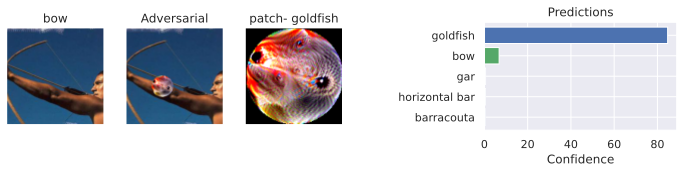

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


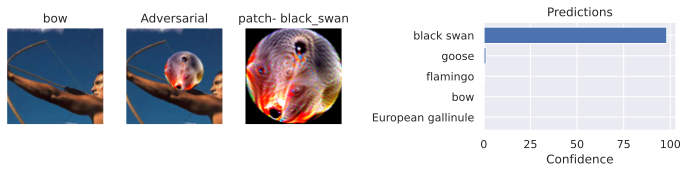

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


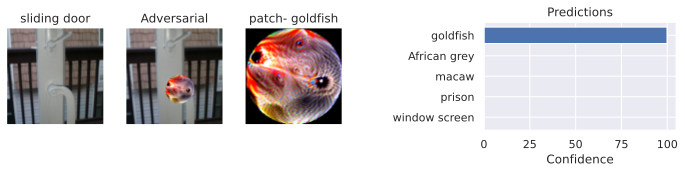

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


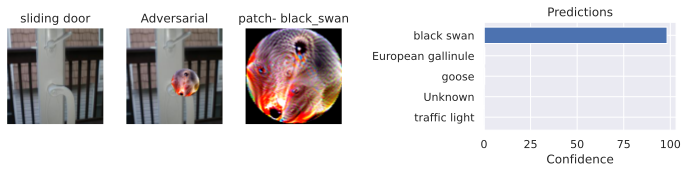

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


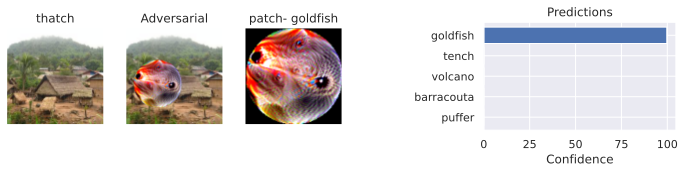

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


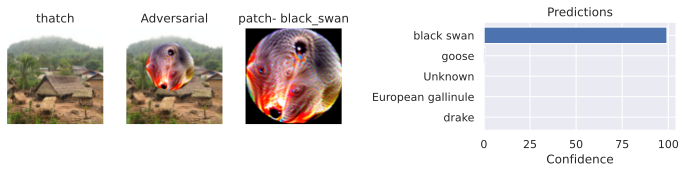

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


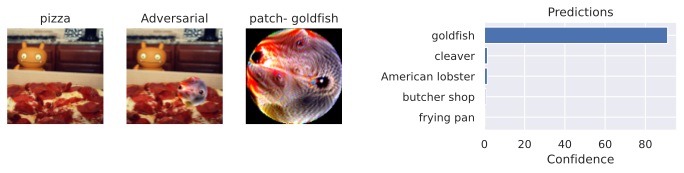

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


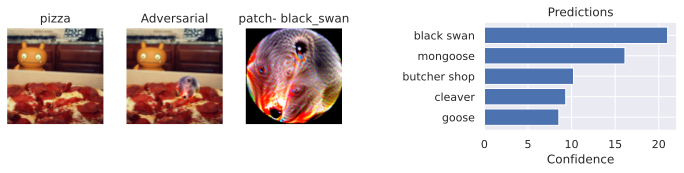

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


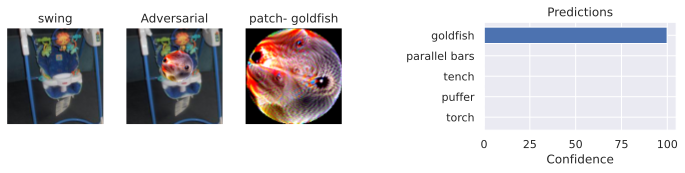

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


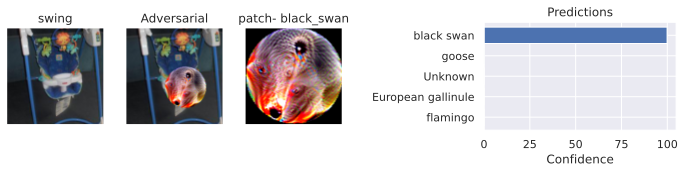

In [ ]:
exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
  d_model = victim_models['resnet34'].to(DEVICE)
  for i in range(0,5):
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=goldfish_black_swan_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=False,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='goldfish')
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=goldfish_black_swan_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=True,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='black_swan')

#### target1: flute, target2: rifle, victim model: vgg16

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old 

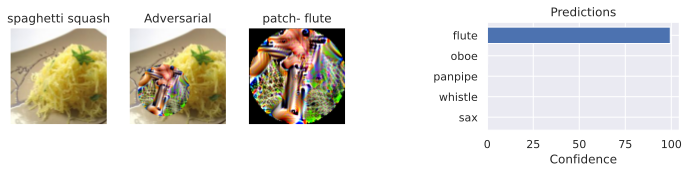

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


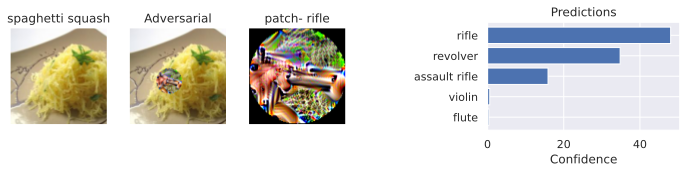

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


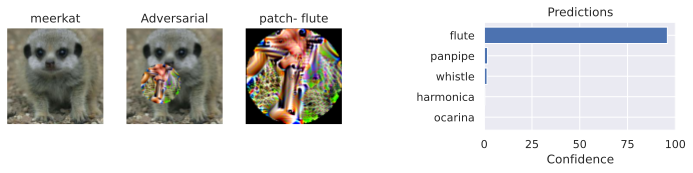

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


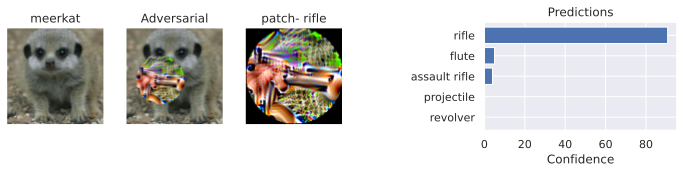

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


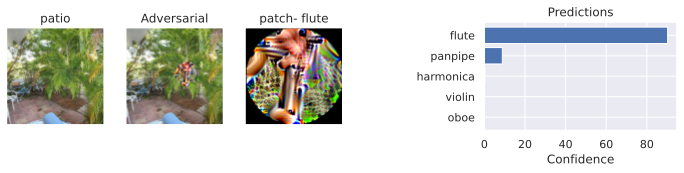

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


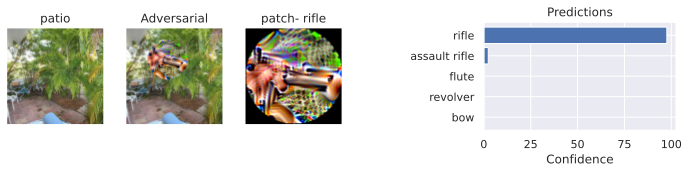

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


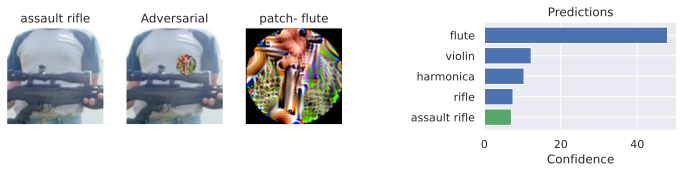

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


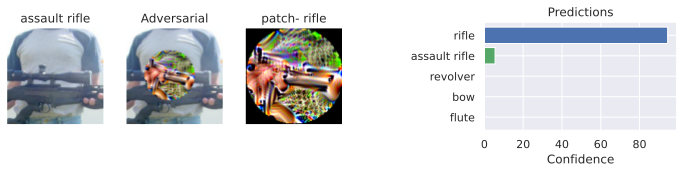

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


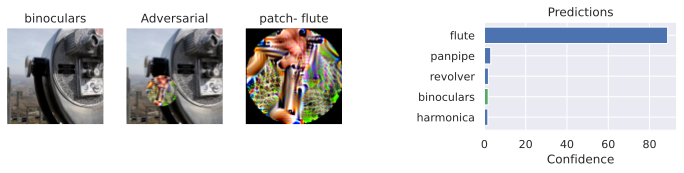

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


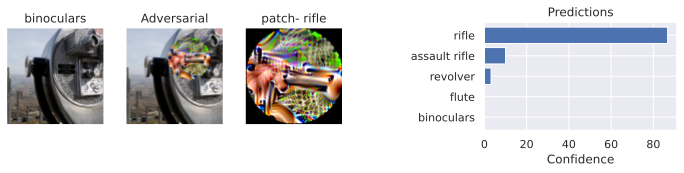

In [ ]:
exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
  d_model = victim_models['vgg16'].to(DEVICE)
  for i in range(0,5):
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=flute_rifle_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=False,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='flute')
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=flute_rifle_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=True,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='rifle')

#### target1: ant, target2: zebra, victim model: densenet121

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old 

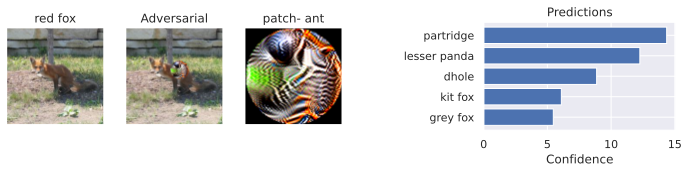

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


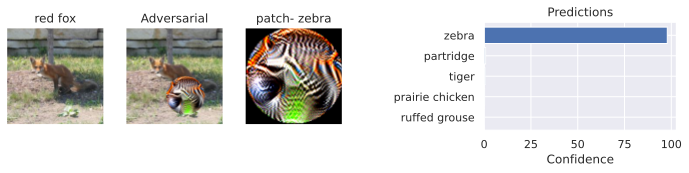

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


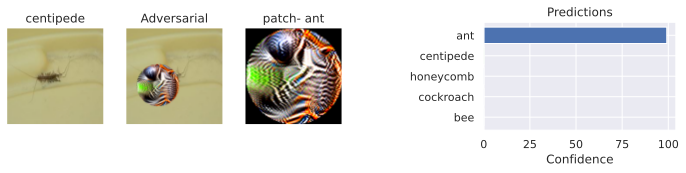

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


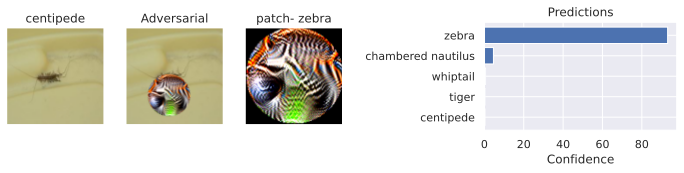

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


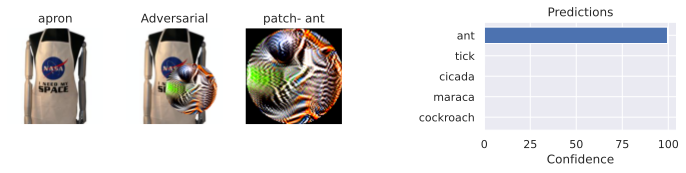

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


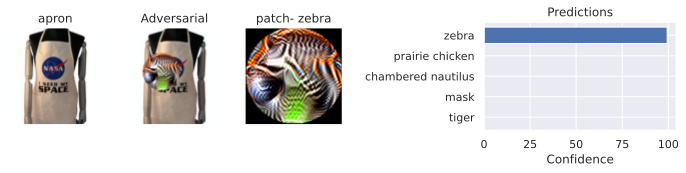

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


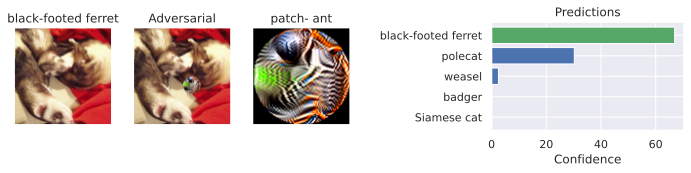

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


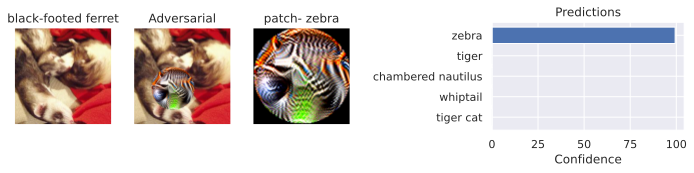

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


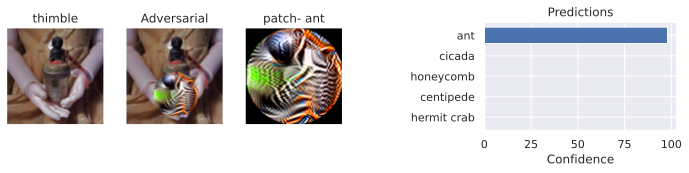

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


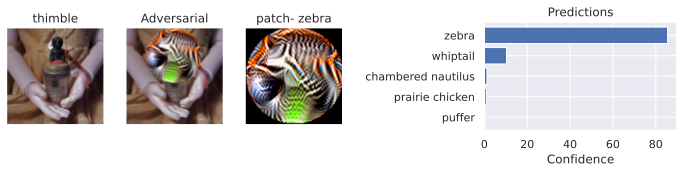

In [ ]:
exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
  d_model = victim_models['densenet121'].to(DEVICE)
  for i in range(0,5):
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=ant_zebra_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=False,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='ant')
    eval_patch_on_image(image=exmp_batch[i],
                        label=label_batch[i], 
                        patch=ant_zebra_patch,
                        mask=mask,
                        model=d_model,
                        scale_range=(0.3, 1),
                        max_angle=10,
                        rotate=True,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        target_name='zebra')

### Patch performence evaluation


#### utility functuions

In [ ]:
### evaluation related functions
def get_top_k_prediction(pred, k):
  with torch.no_grad():
    pred = torch.softmax(pred, dim=-1)
    topk_vals, topk_idx = pred.topk(k, dim=-1)
    topk_vals, topk_idx = topk_vals.cpu().numpy(), topk_idx.cpu().numpy()
  return topk_vals, topk_idx

def count_topk_sucsess_in_batch(pred, k, labels):
  sucsess = 0
  for i in range(len(pred)):
    _, preds_top_k = get_top_k_prediction(pred[i], k)
    if labels[i] in preds_top_k:
      sucsess += 1
  return sucsess

def print_top_k_accurecy(top_k_list, counter_list, num_sampels):

  performence_str_list = ['%d-K: %1.2f%%' % (top_k_list[i], 100 * (counter_list[i] / num_sampels)) for i in range(len(top_k_list))]
  print(', '.join(performence_str_list))

def evaluate_patch_on_model(patch,
                            patch_name,
                            mask,
                            model,
                            model_name,
                            k_top_list,
                            data_loader,
                            patch_size,
                            image_size,
                            scale_range,
                            max_angle,
                            target1_name,
                            target2_name):
  
  target1_index, target2_index = get_label_index(target1_name), get_label_index(target2_name)
  patch_in = patch.clone()
  mask_in = mask.clone()
  patch_in_rot90 = torch.rot90(patch_in, dims=[1,2])
  model.to(DEVICE)
  ## initialize counters
  clean_correct_counter = [0] * len(k_top_list)
  target1_correct_counter = [0] * len(k_top_list)
  target1_target_counter = [0] * len(k_top_list)
  target1_cross_counter = [0] * len(k_top_list)
  target2_correct_counter = [0] * len(k_top_list)
  target2_target_counter = [0] * len(k_top_list)
  target2_cross_counter = [0] * len(k_top_list)
  total_counter = 0

  pbar = tqdm(total=len(data_loader), desc='batch', position=0,
        bar_format='{l_bar}{bar:10}{r_bar}{bar:-10b}')
  pbar.reset()

  for i_batch, sample_batch in enumerate(data_loader):
    img_batch, labels_clean = sample_batch
    img_batch.to(DEVICE)
    img_batch = img_batch.clone().to(DEVICE)
    labels_clean = labels_clean.cpu().numpy()
    batch_size = len(labels_clean)
    labels_target1 = np.asarray([target1_index] * batch_size)
    labels_target2 = np.asarray([target2_index] * batch_size)
    target_torch_size_patch = torch.Size((batch_size, 3, image_size, image_size))
    target_torch_size_mask = torch.Size((batch_size, 1, image_size, image_size))
    ## prediction
    with torch.no_grad():
      ## predict non-adverserial images
      preds_clean = model(img_batch)
      ## get affine matrixes
      affine_matrixes = get_affine_matrixes(patch_size, image_size, scale_range, max_angle, [False] * batch_size).to(DEVICE)

      ## mask transformation
      mask_unsqueeze = torch.unsqueeze(mask_in, dim=0).repeat(batch_size, 3, 1, 1).to(DEVICE)
      trans_masks = apply_affine(affine_matrixes, mask_unsqueeze, target_torch_size_patch).squeeze_().to(DEVICE)

      ## target 1 prediction
      patch_unsqueeze = patch_in.repeat(batch_size, 1, 1, 1).to(DEVICE)
      trans_patches = apply_affine(affine_matrixes, patch_unsqueeze, target_torch_size_patch).to(DEVICE)
      adv_imgs = (1 - trans_masks) * img_batch + trans_masks * trans_patches
      preds_target1 = model(adv_imgs)

      ## target 2 prediction
      patch_unsqueeze_rot90 = patch_in_rot90.repeat(batch_size, 1, 1, 1).to(DEVICE)
      trans_patches_rot90 = apply_affine(affine_matrixes, patch_unsqueeze_rot90, target_torch_size_patch).to(DEVICE)
      adv_imgs_rot90 = (1 - trans_masks) * img_batch + trans_masks * trans_patches_rot90
      preds_target2 = model(adv_imgs_rot90)
    
    ## update counters
    for i, k in enumerate(k_top_list):
      clean_correct_counter[i] += count_topk_sucsess_in_batch(preds_clean, k, labels_clean)

      target1_correct_counter[i] += count_topk_sucsess_in_batch(preds_target1, k, labels_clean)
      target1_target_counter[i] += count_topk_sucsess_in_batch(preds_target1, k, labels_target1)
      target1_cross_counter[i] += count_topk_sucsess_in_batch(preds_target1, k, labels_target2)

      target2_correct_counter[i] += count_topk_sucsess_in_batch(preds_target2, k, labels_clean)
      target2_target_counter[i] += count_topk_sucsess_in_batch(preds_target2, k, labels_target2)
      target2_cross_counter[i] += count_topk_sucsess_in_batch(preds_target2, k, labels_target1)
    total_counter += batch_size
    pbar.update(1)

  print("=================== " + "Model: " + model_name +  " Patch: " + patch_name +" ===================" )
  
  print("model accurecy on clean data:")
  print_top_k_accurecy(k_top_list, clean_correct_counter, total_counter)

  print("adverserial exmpals- scale range: (%1.2f, %1.2f), max angle: %1.2f" %(scale_range[0], scale_range[1], max_angle))
  print("model accurecy on adverserial images of target- \'%s\'-" % target1_name)
  print_top_k_accurecy(k_top_list, target1_correct_counter, total_counter)
  print("target- \'%s\': adverserial sampels that classidied as: \'%s\'-" % (target1_name , target1_name))
  print_top_k_accurecy(k_top_list, target1_target_counter, total_counter)
  print("target- \'%s\': adverserial sampels that classidied as: \'%s\'-" % (target1_name , target2_name))
  print_top_k_accurecy(k_top_list, target1_cross_counter, total_counter)

  print("model accurecy on adverserial images of target- \'%s\'-" % target2_name)
  print_top_k_accurecy(k_top_list, target2_correct_counter, total_counter)
  print("target- \'%s\': adverserial sampels that classidied as: \'%s\'-" % (target2_name , target2_name))
  print_top_k_accurecy(k_top_list, target2_target_counter, total_counter)
  print("target- \'%s\': adverserial sampels that classidied as: \'%s\'-" % (target2_name , target1_name))
  print_top_k_accurecy(k_top_list, target2_cross_counter, total_counter)




    


####target1: goldfish, target2: black swan

##### original victim model: resnet34

In [ ]:
evaluate_patch_on_model(patch=goldfish_black_swan_patch,
                        patch_name='goldfish_black_swan_patch',
                        mask=mask,
                        model=victim_models['resnet34'],
                        model_name='resnet34',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='goldfish',
                        target2_name='black swan')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4289: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:4227: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old 

=================== Model: resnet34 Patch: goldfish_black_swan_patch ===================
model accurecy on clean data:
1-K: 80.90%, 5-K: 95.70%, 10-K: 97.68%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'goldfish'-
1-K: 12.54%, 5-K: 45.92%, 10-K: 55.88%
target- 'goldfish': adverserial sampels that classidied as: 'goldfish'-
1-K: 79.54%, 5-K: 90.62%, 10-K: 93.62%
target- 'goldfish': adverserial sampels that classidied as: 'black swan'-
1-K: 0.04%, 5-K: 0.44%, 10-K: 1.28%
model accurecy on adverserial images of target- 'black swan'-
1-K: 12.10%, 5-K: 34.96%, 10-K: 46.76%
target- 'black swan': adverserial sampels that classidied as: 'black swan'-
1-K: 78.16%, 5-K: 88.76%, 10-K: 91.56%
target- 'black swan': adverserial sampels that classidied as: 'goldfish'-
1-K: 0.24%, 5-K: 8.36%, 10-K: 27.90%


##### cross model patch test:
in the next cell we will test how well goldfish_black_swan_patch that trained to fool resnet34 is fooling vgg16 and densenet121


In [ ]:
evaluate_patch_on_model(patch=goldfish_black_swan_patch,
                        patch_name='goldfish_black_swan_patch',
                        mask=mask,
                        model=victim_models['vgg16'],
                        model_name='vgg16',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='goldfish',
                        target2_name='black swan')

evaluate_patch_on_model(patch=goldfish_black_swan_patch,
                        patch_name='goldfish_black_swan_patch',
                        mask=mask,
                        model=victim_models['densenet121'],
                        model_name='densenet121',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.2, 1],
                        max_angle=10,
                        target1_name='goldfish',
                        target2_name='black swan')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: vgg16 Patch: goldfish_black_swan_patch ===================
model accurecy on clean data:
1-K: 78.40%, 5-K: 94.48%, 10-K: 96.80%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'goldfish'-
1-K: 29.76%, 5-K: 52.80%, 10-K: 62.46%
target- 'goldfish': adverserial sampels that classidied as: 'goldfish'-
1-K: 27.80%, 5-K: 49.98%, 10-K: 59.62%
target- 'goldfish': adverserial sampels that classidied as: 'black swan'-
1-K: 0.06%, 5-K: 0.30%, 10-K: 0.76%
model accurecy on adverserial images of target- 'black swan'-
1-K: 28.04%, 5-K: 49.12%, 10-K: 57.86%
target- 'black swan': adverserial sampels that classidied as: 'black swan'-
1-K: 1.28%, 5-K: 10.54%, 10-K: 19.74%
target- 'black swan': adverserial sampels that classidied as: 'goldfish'-
1-K: 0.38%, 5-K: 1.66%, 10-K: 4.28%


batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: densenet121 Patch: goldfish_black_swan_patch ===================
model accurecy on clean data:
1-K: 80.76%, 5-K: 95.32%, 10-K: 97.52%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'goldfish'-
1-K: 43.76%, 5-K: 67.78%, 10-K: 75.66%
target- 'goldfish': adverserial sampels that classidied as: 'goldfish'-
1-K: 19.14%, 5-K: 49.50%, 10-K: 63.64%
target- 'goldfish': adverserial sampels that classidied as: 'black swan'-
1-K: 0.06%, 5-K: 0.32%, 10-K: 0.80%
model accurecy on adverserial images of target- 'black swan'-
1-K: 40.66%, 5-K: 62.28%, 10-K: 69.78%
target- 'black swan': adverserial sampels that classidied as: 'black swan'-
1-K: 1.76%, 5-K: 11.86%, 10-K: 22.24%
target- 'black swan': adverserial sampels that classidied as: 'goldfish'-
1-K: 0.38%, 5-K: 2.70%, 10-K: 7.44%


####target1: flute, target2: rifle

##### original victim model: vgg16

In [ ]:
evaluate_patch_on_model(patch=flute_rifle_patch,
                        patch_name='flute_rifle_patch',
                        mask=mask,
                        model=victim_models['vgg16'],
                        model_name='vgg16',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='flute',
                        target2_name='rifle')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: vgg16 Patch: flute_rifle_patch ===================
model accurecy on clean data:
1-K: 78.40%, 5-K: 94.48%, 10-K: 96.80%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'flute'-
1-K: 5.02%, 5-K: 12.68%, 10-K: 17.82%
target- 'flute': adverserial sampels that classidied as: 'flute'-
1-K: 86.64%, 5-K: 94.90%, 10-K: 96.74%
target- 'flute': adverserial sampels that classidied as: 'rifle'-
1-K: 0.04%, 5-K: 14.66%, 10-K: 48.80%
model accurecy on adverserial images of target- 'rifle'-
1-K: 4.44%, 5-K: 10.10%, 10-K: 16.82%
target- 'rifle': adverserial sampels that classidied as: 'rifle'-
1-K: 85.56%, 5-K: 94.38%, 10-K: 95.90%
target- 'rifle': adverserial sampels that classidied as: 'flute'-
1-K: 0.70%, 5-K: 73.02%, 10-K: 91.42%


##### cross model patch test:
in the next cell we will test how well flute_rifle_patch that trained to fool vgg16 is fooling resnet34 and densenet121


In [ ]:
evaluate_patch_on_model(patch=flute_rifle_patch,
                        patch_name='flute_rifle_patch',
                        mask=mask,
                        model=victim_models['resnet34'],
                        model_name='resnet34',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='flute',
                        target2_name='rifle')

evaluate_patch_on_model(patch=flute_rifle_patch,
                        patch_name='flute_rifle_patch',
                        mask=mask,
                        model=victim_models['densenet121'],
                        model_name='densenet121',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='flute',
                        target2_name='rifle')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: resnet34 Patch: flute_rifle_patch ===================
model accurecy on clean data:
1-K: 80.90%, 5-K: 95.70%, 10-K: 97.68%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'flute'-
1-K: 37.64%, 5-K: 59.36%, 10-K: 68.34%
target- 'flute': adverserial sampels that classidied as: 'flute'-
1-K: 17.34%, 5-K: 40.86%, 10-K: 49.52%
target- 'flute': adverserial sampels that classidied as: 'rifle'-
1-K: 0.26%, 5-K: 3.34%, 10-K: 10.34%
model accurecy on adverserial images of target- 'rifle'-
1-K: 32.42%, 5-K: 53.32%, 10-K: 64.14%
target- 'rifle': adverserial sampels that classidied as: 'rifle'-
1-K: 24.22%, 5-K: 59.56%, 10-K: 65.92%
target- 'rifle': adverserial sampels that classidied as: 'flute'-
1-K: 2.82%, 5-K: 18.32%, 10-K: 34.32%


batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: densenet121 Patch: flute_rifle_patch ===================
model accurecy on clean data:
1-K: 80.76%, 5-K: 95.32%, 10-K: 97.52%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'flute'-
1-K: 49.26%, 5-K: 71.36%, 10-K: 78.48%
target- 'flute': adverserial sampels that classidied as: 'flute'-
1-K: 14.16%, 5-K: 36.74%, 10-K: 48.52%
target- 'flute': adverserial sampels that classidied as: 'rifle'-
1-K: 0.28%, 5-K: 4.18%, 10-K: 11.56%
model accurecy on adverserial images of target- 'rifle'-
1-K: 48.06%, 5-K: 68.98%, 10-K: 77.46%
target- 'rifle': adverserial sampels that classidied as: 'rifle'-
1-K: 6.64%, 5-K: 31.18%, 10-K: 44.26%
target- 'rifle': adverserial sampels that classidied as: 'flute'-
1-K: 9.28%, 5-K: 30.76%, 10-K: 43.82%


####target1: ant, target2: zebra

##### original victim model: densenet121

In [ ]:
evaluate_patch_on_model(patch=ant_zebra_patch,
                        patch_name='ant_zebra_patch',
                        mask=mask,
                        model=victim_models['densenet121'],
                        model_name='densenet121',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='ant',
                        target2_name='zebra')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: densenet121 Patch: ant_zebra_patch ===================
model accurecy on clean data:
1-K: 80.76%, 5-K: 95.32%, 10-K: 97.52%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'ant'-
1-K: 13.06%, 5-K: 38.76%, 10-K: 47.82%
target- 'ant': adverserial sampels that classidied as: 'ant'-
1-K: 78.88%, 5-K: 89.98%, 10-K: 93.28%
target- 'ant': adverserial sampels that classidied as: 'zebra'-
1-K: 0.06%, 5-K: 0.60%, 10-K: 1.68%
model accurecy on adverserial images of target- 'zebra'-
1-K: 14.26%, 5-K: 42.16%, 10-K: 54.14%
target- 'zebra': adverserial sampels that classidied as: 'zebra'-
1-K: 75.04%, 5-K: 89.80%, 10-K: 93.32%
target- 'zebra': adverserial sampels that classidied as: 'ant'-
1-K: 0.00%, 5-K: 0.08%, 10-K: 0.30%


##### cross model patch test:
in the next cell we will test how well flute_rifle_patch that trained to fool densenet121 is fooling vgg16 and resnet34


In [ ]:
evaluate_patch_on_model(patch=ant_zebra_patch,
                        patch_name='ant_zebra_patch',
                        mask=mask,
                        model=victim_models['resnet34'],
                        model_name='resnet34',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='ant',
                        target2_name='zebra')

evaluate_patch_on_model(patch=ant_zebra_patch,
                        patch_name='ant_zebra_patch',
                        mask=mask,
                        model=victim_models['vgg16'],
                        model_name='vgg16',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_range=[0.3, 1],
                        max_angle=10,
                        target1_name='ant',
                        target2_name='zebra')

batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: resnet34 Patch: ant_zebra_patch ===================
model accurecy on clean data:
1-K: 80.90%, 5-K: 95.70%, 10-K: 97.68%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'ant'-
1-K: 37.64%, 5-K: 59.66%, 10-K: 67.66%
target- 'ant': adverserial sampels that classidied as: 'ant'-
1-K: 0.44%, 5-K: 5.26%, 10-K: 13.18%
target- 'ant': adverserial sampels that classidied as: 'zebra'-
1-K: 0.12%, 5-K: 1.02%, 10-K: 2.34%
model accurecy on adverserial images of target- 'zebra'-
1-K: 38.06%, 5-K: 60.60%, 10-K: 68.60%
target- 'zebra': adverserial sampels that classidied as: 'zebra'-
1-K: 0.86%, 5-K: 4.64%, 10-K: 8.20%
target- 'zebra': adverserial sampels that classidied as: 'ant'-
1-K: 0.02%, 5-K: 0.38%, 10-K: 1.94%


batch:   0%|          | 0/79 [00:00<?, ?it/s]

=================== Model: vgg16 Patch: ant_zebra_patch ===================
model accurecy on clean data:
1-K: 78.40%, 5-K: 94.48%, 10-K: 96.80%
adverserial exmpals- scale range: (0.30, 1.00), max angle: 10.00
model accurecy on adverserial images of target- 'ant'-
1-K: 28.46%, 5-K: 49.62%, 10-K: 59.24%
target- 'ant': adverserial sampels that classidied as: 'ant'-
1-K: 0.06%, 5-K: 0.38%, 10-K: 1.98%
target- 'ant': adverserial sampels that classidied as: 'zebra'-
1-K: 0.06%, 5-K: 0.30%, 10-K: 0.84%
model accurecy on adverserial images of target- 'zebra'-
1-K: 27.92%, 5-K: 48.68%, 10-K: 58.40%
target- 'zebra': adverserial sampels that classidied as: 'zebra'-
1-K: 1.20%, 5-K: 5.32%, 10-K: 10.48%
target- 'zebra': adverserial sampels that classidied as: 'ant'-
1-K: 0.00%, 5-K: 0.04%, 10-K: 0.24%


#### results discussion

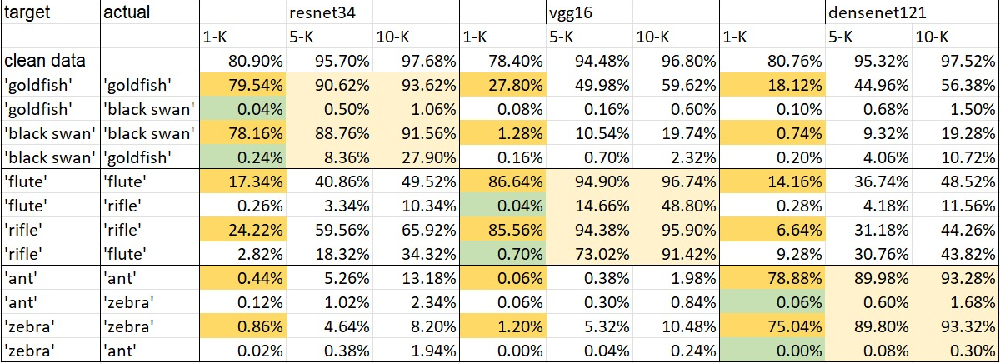

In this table we can see a summary of the Patch performance evaluation section.


We have three patches and three victim models. Each of the patches is optimized against one model and tested against all of the three. The goldfish_black_swan patch optimized against resnet-34, the flute_rifle patch optimized against vgg-16 and the ant_zebra patch optimized against densenet-121. In each of the performance tests, we display the top-1, top-5, and top-10 scores.


The first line shows the victim models' raw performance on the clean data. We have no impact on this performance. As we can see, the model's performance is quite high considering it is a 1000 label classification problem.


On the "main diagonal" of the table (in light orange) we can see the performance of each patch against the model the patch is optimized to fool. We can see that for each patch we have a high success rate against his model (in dark orange) and also high specificity (in green).


We can also see that the patches demonstrate low (but existing) model transferability and that transferability is better when the patch is optimized against resnet-34 and vgg-16 than when it is optimized against densenet-121.



###Patch Size Evaluation

The size of the patch has a high impact on his success rate (for example, it is easier to fool a model with a patch covering the entire image).

That's why it is crucial to quantify how patch size affects patch success rate. It is also beneficial to know what patch size is effective against each model.

#### utility functions


In [ ]:
def evaluate_patch_on_scale(patch,
                            mask,
                            model,
                            k_top_list,
                            data_loader,
                            patch_size,
                            image_size,
                            scale,
                            max_angle,
                            target1_name,
                            target2_name):
  
  target1_index, target2_index = get_label_index(target1_name), get_label_index(target2_name)
  patch_in = patch.clone()
  mask_in = mask.clone()
  patch_in_rot90 = torch.rot90(patch_in, dims=[1,2])
  model.to(DEVICE)

  ## initialize counters
  target1_target_counter = [0] * len(k_top_list)
  target2_target_counter = [0] * len(k_top_list)

  total_counter = 0

  pbar = tqdm(total=len(data_loader), desc='batch', position=0,
        bar_format='{l_bar}{bar:10}{r_bar}{bar:-10b}')
  pbar.reset()

  for i_batch, sample_batch in enumerate(data_loader):
    img_batch, labels_clean = sample_batch
    img_batch.to(DEVICE)
    img_batch = img_batch.clone().to(DEVICE)
    labels_clean = labels_clean.cpu().numpy()
    batch_size = len(labels_clean)
    labels_target1 = np.asarray([target1_index] * batch_size)
    labels_target2 = np.asarray([target2_index] * batch_size)
    target_torch_size_patch = torch.Size((batch_size, 3, image_size, image_size))
    target_torch_size_mask = torch.Size((batch_size, 1, image_size, image_size))
    ## prediction
    with torch.no_grad():

      ## get affine matrixes
      affine_matrixes = get_affine_matrixes(patch_size, image_size, (scale, scale), max_angle, [False] * batch_size).to(DEVICE)

      ## mask transformation
      mask_unsqueeze = torch.unsqueeze(mask_in, dim=0).repeat(batch_size, 3, 1, 1).to(DEVICE)
      trans_masks = apply_affine(affine_matrixes, mask_unsqueeze, target_torch_size_patch).squeeze_().to(DEVICE)

      ## target 1 prediction
      patch_unsqueeze = patch_in.repeat(batch_size, 1, 1, 1).to(DEVICE)
      trans_patches = apply_affine(affine_matrixes, patch_unsqueeze, target_torch_size_patch).to(DEVICE)
      adv_imgs = (1 - trans_masks) * img_batch + trans_masks * trans_patches
      preds_target1 = model(adv_imgs)

      ## target 2 prediction
      patch_unsqueeze_rot90 = patch_in_rot90.repeat(batch_size, 1, 1, 1).to(DEVICE)
      trans_patches_rot90 = apply_affine(affine_matrixes, patch_unsqueeze_rot90, target_torch_size_patch).to(DEVICE)
      adv_imgs_rot90 = (1 - trans_masks) * img_batch + trans_masks * trans_patches_rot90
      preds_target2 = model(adv_imgs_rot90)
    
    ## update counters
    for i, k in enumerate(k_top_list):

      target1_target_counter[i] += count_topk_sucsess_in_batch(preds_target1, k, labels_target1)
      target2_target_counter[i] += count_topk_sucsess_in_batch(preds_target2, k, labels_target2)

    total_counter += batch_size
    pbar.update(1)

  target1_success_rate = []
  target2_success_rate = []
  for i in range(len(k_top_list)):
    target1_success_rate.append(100 * target1_target_counter[i] / total_counter)
    target2_success_rate.append(100 * target2_target_counter[i] / total_counter)

  return target1_success_rate, target2_success_rate

def evaluate_patch_on_scales(patch,
                            patch_name,
                            mask,
                            model,
                            model_name,
                            k_top_list,
                            data_loader,
                            patch_size,
                            image_size,
                            scale_list,
                            max_angle,
                            target1_name,
                            target2_name):
  print("====================" + " Ptch: %s, Model %s " % (patch_name, model_name) + "====================")
  target1 = [[] for _ in range(len(k_top_list))]
  target2 = [[] for _ in range(len(k_top_list))]
  for scale in scale_list:
    print("calculate success rate for scale: %1.2f" % scale)
    tar1, tar2 = evaluate_patch_on_scale(patch,
                                        mask,
                                        model,
                                        k_top_list,
                                        data_loader,
                                        patch_size,
                                        image_size,
                                        scale,
                                        max_angle,
                                        target1_name,
                                        target2_name)
    for i in range(len(k_top_list)):
      target1[i].append(tar1[i])
      target2[i].append(tar2[i])

  fig, ax = plt.subplots(1, 2, figsize=(10,2), gridspec_kw={'width_ratios': [1, 1]})
  for i in range(len(k_top_list)):
    ax[0].plot(scale_list, target1[i])
    ax[1].plot(scale_list, target2[i])
  legends_names = ['top-' + str(k) for k in k_top_list]
  ax[0].set_xlabel('patch scale')
  ax[0].set_xlabel('success rate in %')
  ax[0].legend(legends_names)
  ax[0].set_title("target: %s" % target1_name)
  ax[1].set_xlabel('patch scale')
  ax[1].set_ylabel('success rate in %')
  ax[1].legend(legends_names)
  ax[1].set_title("target: %s" % target2_name)

####plots

==================== Ptch: goldfish_black_swan_patch, Model resnet34 ====================
calculate success rate for scale: 0.30


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.40


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.50


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.60


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.70


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.80


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.90


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 1.00


batch:   0%|          | 0/79 [00:00<?, ?it/s]

==================== Ptch: flute_rifle_patch, Model vgg16 ====================
calculate success rate for scale: 0.30


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.40


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.50


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.60


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.70


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.80


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.90


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 1.00


batch:   0%|          | 0/79 [00:00<?, ?it/s]

==================== Ptch: ant_zebra_patch, Model densenet121 ====================
calculate success rate for scale: 0.30


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.40


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.50


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.60


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.70


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.80


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 0.90


batch:   0%|          | 0/79 [00:00<?, ?it/s]

calculate success rate for scale: 1.00


batch:   0%|          | 0/79 [00:00<?, ?it/s]

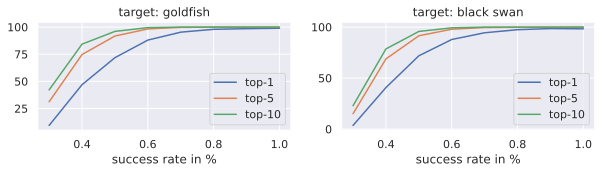

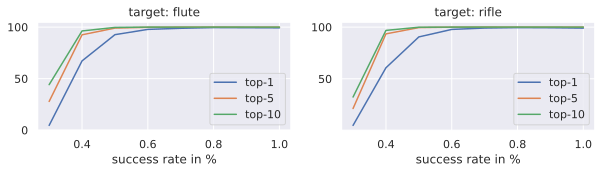

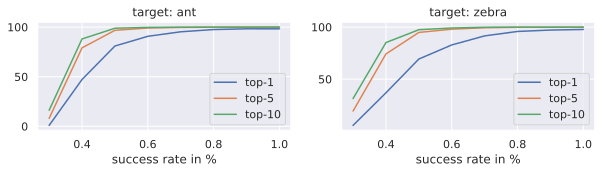

In [ ]:
evaluate_patch_on_scales(patch=goldfish_black_swan_patch,
                        patch_name='goldfish_black_swan_patch',
                        mask=mask,
                        model=victim_models['resnet34'],
                        model_name='resnet34',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_list=[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                        max_angle=10,
                        target1_name='goldfish',
                        target2_name='black swan')

evaluate_patch_on_scales(patch=flute_rifle_patch,
                        patch_name='flute_rifle_patch',
                        mask=mask,
                        model=victim_models['vgg16'],
                        model_name='vgg16',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_list=[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                        max_angle=10,
                        target1_name='flute',
                        target2_name='rifle')

evaluate_patch_on_scales(patch=ant_zebra_patch,
                        patch_name='ant_zebra_patch',
                        mask=mask,
                        model=victim_models['densenet121'],
                        model_name='densenet121',
                        k_top_list=[1, 5, 10],
                        data_loader= data_loader,
                        patch_size=PATCH_SIZE,
                        image_size=IMAGE_SIZE,
                        scale_list=[0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                        max_angle=10,
                        target1_name='ant',
                        target2_name='zebra')

In this graph we can see on the x axis the scale rate that multiplies the patches. The patches original size is 128X128 so for example if the scale is 0.5 the tested size is 64 X 64. The Y axis represents the success rate in %.


We can see that all the patches are becoming actualy effective at scale of 0.4. and becoming very effective from scale=0.6.